In [238]:
import segyio
import numpy as np
from scipy.signal import butter, filtfilt, decimate, resample

x2offsets = lambda x_list: [x[0,:] for x in x_list]

def highpass(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 4):
    b, a = butter(poles, cutoff, 'highpass', fs=sample_rate)
    filtered_data = filtfilt(b, a, data, axis=0)
    return filtered_data

def lowpass1d(data: np.ndarray, cutoff: float, sample_rate: float, poles: int = 4):
    b, a = butter(poles, cutoff, 'lowpass', fs=sample_rate)
    filtered_data = filtfilt(b, a, data)
    return filtered_data

def get_xyz(raws, offsets, num_sample: int, sampling_rate=250, reduction_velocity=6.0):
    x = [np.array([offset]*(num_sample))/1000 for offset in offsets]
    y = [(np.array([list(range(num_sample))]*len(offset)).T/sampling_rate) for offset in offsets]
    if reduction_velocity is not None:
        for i in range(len(y)): y[i] -= abs(x[i])/reduction_velocity
    z = [raw.T[:num_sample,:] for raw in raws]
    return x,y,z

def read_segy(filename, fix_unsigned_offset=False, reduction_velocity=None, original_delta=250, downsample_t_every=None):
    # new_delta = original_delta if downsample_t_every is None else original_delta/downsample_t_every
    # downsample_t = lambda arr: [lowpass1d(el[:,::downsample_t_every], new_delta/2.1, new_delta) for el in arr] if downsample_t_every is not None else arr
    # downsample_t = lambda arr: [el[:,::downsample_t_every] for el in arr] if downsample_t_every is not None else arr
    if downsample_t_every is None:
        resample_t = lambda arr: arr
        new_delta = original_delta
    elif downsample_t_every < 0:
        resample_t = lambda arr: [resample(el, int(-downsample_t_every*el.shape[-1]), axis=-1) for el in arr]
        new_delta = int(-downsample_t_every*original_delta)
    else:
        resample_t = lambda arr: [decimate(el, downsample_t_every, ftype='fir') for el in arr] 
        new_delta = original_delta/downsample_t_every
    with segyio.open(filename, ignore_geometry=True) as f:
        headers = f.header

        if np.log10(headers[0][1]) > 5:
            raws = [np.array([f.trace.raw[i] for i in range(len(f.trace.raw))])]
            offsets = [np.array([header[37] for header in f.header])]
        else:
            ntrace_ends = []
            for idx, header in enumerate(headers):
                # when shot number defined by TRACE_SEQUENCE_LINE
                if header[21]==0:
                    if header[1]//10000 > len(ntrace_ends):
                        ntrace_ends.append(idx)
                # when station is defined as FieldRecord
                else:
                    if header[9] > len(ntrace_ends):
                        ntrace_ends.append(idx)
            ntrace_ends.append(None)

            raws = [np.array(f.trace.raw[ntrace_ends[i]:ntrace_ends[i+1]]) for i in range(len(ntrace_ends)-1)]
            offsets = [np.array([header[37] for header in f.header[ntrace_ends[i]:ntrace_ends[i+1]]]) for i in range(len(ntrace_ends)-1)]

        if fix_unsigned_offset:
            for idx in range(len(offsets)):
                if offsets[idx][np.argmin(offsets[idx])-1] < offsets[idx][np.argmin(offsets[idx])+1]:
                    offsets[idx][:np.argmin(offsets[idx])] *= -1
                else:
                    offsets[idx][:np.argmin(offsets[idx])+1] *= -1
        raws = resample_t(raws)
        # print(raws[0].shape)
        num_sample = headers[0][115] if (downsample_t_every is None) or downsample_t_every>0 else int(headers[0][115]*-downsample_t_every)
        return get_xyz(raws, offsets, num_sample=num_sample, reduction_velocity=reduction_velocity, sampling_rate=new_delta)
    
# def read_segy_nwp(filename, fix_unsigned_offset=False, reduction_velocity=None, sampling_rate=100, downsample_t_every=None):
#     downsample_t = lambda arr: [el[::downsample_t_every,:] for el in arr]
#     with segyio.open(filename, ignore_geometry=True) as f:
#         headers = f.header
#         print(headers[0])

#         raws = [np.array([f.trace.raw[i] for i in range(len(f.trace.raw))])]
#         offsets = [np.array([header[37] for header in f.header])]

#         if downsample_t_every is None: return get_xyz(raws, offsets, num_sample=headers[0][115], reduction_velocity=reduction_velocity, sampling_rate=sampling_rate)
#         else: return map(downsample_t, get_xyz(raws, offsets, num_sample=headers[0][115], reduction_velocity=reduction_velocity, sampling_rate=sampling_rate))

In [71]:
with segyio.open(filename = 'nwp/kr0906ky0903_A2_mcs_s019-1.sgy', ignore_geometry=True) as f:
        headers = f.header
        print(headers[0])
        raws = [np.array([f.trace.raw[i] for i in range(len(f.trace.raw))])]
        offsets = [np.array([header[37] for header in f.header])]
        # if downsample_t_every is None: return get_xyz(raws, offsets, num_sample=headers[0][115], reduction_velocity=reduction_velocity, sampling_rate=sampling_rate)
        # else: return map(downsample_t, get_xyz(raws, offsets, num_sample=headers[0][115], reduction_velocity=reduction_velocity, sampling_rate=sampling_rate))
        print(headers[800][1])
        print(headers[1000])
        print(headers[1220])
        print(headers[-1])

{TRACE_SEQUENCE_LINE: 608520045, TRACE_SEQUENCE_FILE: 0, FieldRecord: 608520045, TraceNumber: 1, EnergySourcePoint: 0, CDP: 0, CDP_TRACE: 0, TraceIdentificationCode: 1, NSummedTraces: 0, NStackedTraces: 0, DataUse: 0, offset: -125393, ReceiverGroupElevation: 0, SourceSurfaceElevation: 0, SourceDepth: 10, ReceiverDatumElevation: 0, SourceDatumElevation: 0, SourceWaterDepth: 6860, GroupWaterDepth: 5286, ElevationScalar: 0, SourceGroupScalar: -1000, SourceX: 527814468, SourceY: 150855120, GroupX: 530428327, GroupY: 147298093, CoordinateUnits: 2, WeatheringVelocity: 0, SubWeatheringVelocity: 0, SourceUpholeTime: 0, GroupUpholeTime: 0, SourceStaticCorrection: 0, GroupStaticCorrection: 0, TotalStaticApplied: 0, LagTimeA: 4, LagTimeB: 0, DelayRecordingTime: 0, MuteTimeStart: 0, MuteTimeEND: 0, TRACE_SAMPLE_COUNT: 8000, TRACE_SAMPLE_INTERVAL: 10000, GainType: 0, InstrumentGainConstant: 0, InstrumentInitialGain: 0, Correlated: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, SweepLength: 0, Swe

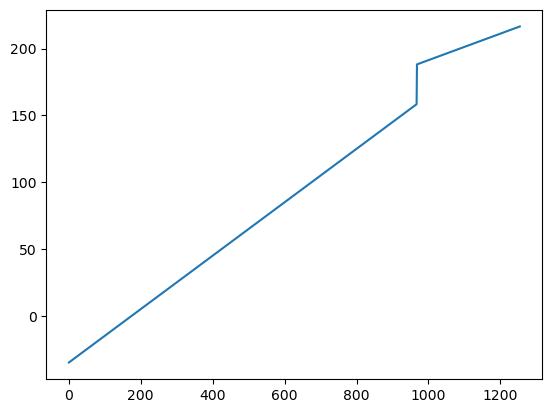

In [54]:
plt.plot(x[0][0])

In [9]:
# filename = 'noto/NT24OBS_J37C-1.sgy'
# filename = 'noto/OBS/NT24OBS_J38C-1.sgy'
filename = 'noto/MCS/NT24MCS_J30C-1.sgy'
# filename = 'noto/NWPacific/kr0906ky0903_A2_mcs_s010-1.sgy'

with segyio.open(filename, ignore_geometry=True) as f:
    # print(f)
    # print(min(f.trace[1200]),max(f.trace[1200]))
    # print(f.header[100])
    # raw = np.array(f.trace.raw[:503])
    # raw = np.array(f.trace.raw[503:1005])
    headers = f.header
    # header = headers[1]
    # print(headers[0][115])
    print(headers[2500])
    # print(f.trace)
    # print(headers[3][21])
    nshoot = 0
    ntrace_shoot_ends = []
    for idx, header in enumerate(headers):
        if header[1]//10000 > nshoot:
            ntrace_shoot_ends.append(idx)
            nshoot = header[1]//10000
    ntrace_shoot_ends.append(None)
    # print(headers[1005][1])
    raws = [np.array(f.trace.raw[ntrace_shoot_ends[i]:ntrace_shoot_ends[i+1]]) for i in range(len(ntrace_shoot_ends)-1)]
    # print(dict(header).values())
    offsets = [[header[37] for header in f.header[ntrace_shoot_ends[i]:ntrace_shoot_ends[i+1]]] for i in range(len(ntrace_shoot_ends)-1)]
    ns = headers[0][115]
    # print(raw.shape)
#     # print(f.trace[0])
#     data = np.array([f.trace[i][3000:3128] for i in range(320,384)])
# segyio.tools.cube
# data = segyio.tools.cube('/Users/junsu/Downloads/namss.P1-13-LA-GC.mcs.airgun/Data/SEGY/Stack/GC125-stk.sgy', strict=False)
    # print('Survey Inline/Xline shape:' +str(np.shape(seismic_data)[0])+' / ' +str(np.shape(seismic_data)[1]))



{TRACE_SEQUENCE_LINE: 633520005, TRACE_SEQUENCE_FILE: 0, FieldRecord: 633520005, TraceNumber: 1, EnergySourcePoint: 0, CDP: 0, CDP_TRACE: 0, TraceIdentificationCode: 1, NSummedTraces: 0, NStackedTraces: 0, DataUse: 0, offset: 23618, ReceiverGroupElevation: 0, SourceSurfaceElevation: 0, SourceDepth: 10, ReceiverDatumElevation: 0, SourceDatumElevation: 0, SourceWaterDepth: 5277, GroupWaterDepth: 5116, ElevationScalar: 0, SourceGroupScalar: -1000, SourceX: 530419284, SourceY: 147307680, GroupX: 529933690, GroupY: 147979260, CoordinateUnits: 2, WeatheringVelocity: 0, SubWeatheringVelocity: 0, SourceUpholeTime: 0, GroupUpholeTime: 0, SourceStaticCorrection: 0, GroupStaticCorrection: 0, TotalStaticApplied: 0, LagTimeA: 2, LagTimeB: 0, DelayRecordingTime: 0, MuteTimeStart: 0, MuteTimeEND: 0, TRACE_SAMPLE_COUNT: 8000, TRACE_SAMPLE_INTERVAL: 10000, GainType: 0, InstrumentGainConstant: 0, InstrumentInitialGain: 0, Correlated: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, SweepLength: 0, Sweep

In [53]:
import segyio
import numpy as np
filename = '/Users/junsu/Downloads/DiversityStack_Gather_NT24-OBS135.sgy'
with segyio.open(filename, ignore_geometry=True) as f:
    # print(f.header[501][9])
    # print(f.trace.raw[0])

    # raw = np.array(f.trace.raw[0:501])
    headers = f.header
    # print(f.trace)
    print(headers[0])
    # header = headers[1]
    # print(headers[0][115])
    nshoot = 0
    ntrace_ends = []
    for idx, header in enumerate(headers):
        if header[9] > len(ntrace_ends):
            ntrace_ends.append(idx)
    ntrace_ends.append(None)
    # print(headers[1005][1])
    raws = [np.array(f.trace.raw[ntrace_ends[i]:ntrace_ends[i+1]]) for i in range(len(ntrace_ends)-1)]
    # print(dict(header).values())
    offsets = np.array([[header[37] for header in f.header[ntrace_ends[i]:ntrace_ends[i+1]]] for i in range(len(ntrace_ends)-1)])
    for idx in range(offsets.shape[0]):
        if offsets[idx,np.argmin(offsets[idx])-1] < offsets[idx,np.argmin(offsets[idx])+1]:
            offsets[idx,:np.argmin(offsets[idx])] *= -1
        else:
            offsets[idx,:np.argmin(offsets[idx])+1] *= -1
    ns = headers[0][115]

{TRACE_SEQUENCE_LINE: 1, TRACE_SEQUENCE_FILE: 1, FieldRecord: 1, TraceNumber: 503, EnergySourcePoint: 1000, CDP: 1, CDP_TRACE: 1, TraceIdentificationCode: 1, NSummedTraces: 0, NStackedTraces: 0, DataUse: 0, offset: 10903, ReceiverGroupElevation: 7260, SourceSurfaceElevation: 100, SourceDepth: 0, ReceiverDatumElevation: 0, SourceDatumElevation: 0, SourceWaterDepth: 999990, GroupWaterDepth: 0, ElevationScalar: -10, SourceGroupScalar: -10, SourceX: 6882761, SourceY: 42202826, GroupX: 6980166, GroupY: 42153841, CoordinateUnits: 1, WeatheringVelocity: 0, SubWeatheringVelocity: 0, SourceUpholeTime: 0, GroupUpholeTime: 0, SourceStaticCorrection: -45, GroupStaticCorrection: 0, TotalStaticApplied: 0, LagTimeA: 0, LagTimeB: 0, DelayRecordingTime: 0, MuteTimeStart: 0, MuteTimeEND: 0, TRACE_SAMPLE_COUNT: 16000, TRACE_SAMPLE_INTERVAL: 4000, GainType: 0, InstrumentGainConstant: 0, InstrumentInitialGain: 0, Correlated: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, SweepLength: 0, SweepType: 0, Swe

In [17]:
# ns = 200
x = [np.array([offset]*(ns))/1000 for offset in offsets]
y = [(np.array([list(range(ns))]*len(offset)).T/250) for offset in offsets]
# for i in range(len(y)): y[i] -= abs(x[i])/6.0
z = [raw.T[:ns,:] for raw in raws]

# for i in [x, y, z]:
#     i[:] = i[:,48:53]
# x = x[:,48:58]
# y = y[:,48:58]
# z = z[:,48:58]

In [645]:
shift = 11
def shift_z(z, line1, line2, shift):
    if shift > 0:
        for j in range(z[line2].shape[1]):
            z[line2][:,j] = np.concatenate([np.zeros(shift), z[line2][:,j][:-shift]])
    elif shift < 0:        
        for j in range(z[line1].shape[1]):
            z[line1][:,j] = np.concatenate([np.zeros(shift), z[line1][:,j][:-shift]])
    return z
z = shift_z(z, 0, 1, shift)

In [ ]:
# cube=np.array([
#     np.flip(z[0][:,3:],axis=1),
#     z[1][:,2:],
#     z[2][:,2:],
#     z[3][:,2:],
#     np.flip(z[4][:,3:],axis=1)
#     ])

In [12]:
from scipy.signal import correlate2d, butter
a = np.array([[1,2,3],[4,5,6]])
v = np.array([[1,-2,1]])
# correlate2d(a, v, mode="same", boundary="wrap") 
a

array([[1, 2, 3],
       [4, 5, 6]])

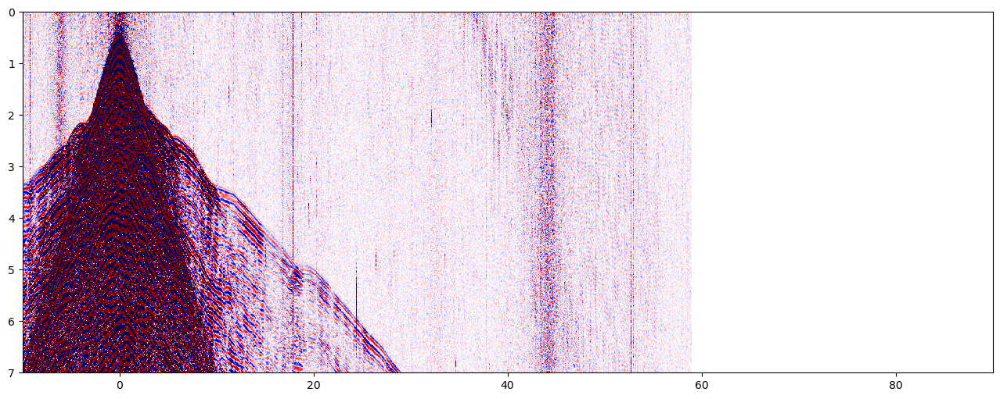

In [18]:
import matplotlib.pyplot as plt
import re

nshoot = 0
clip = 3e+2
vmin, vmax = -clip, clip

# Figure
figsize=(16, 6)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs = axs.ravel()
# im = axs[0].imshow(raw[:502].T, cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# z = raw[:502].T
# x = x[10000:10200,200:250]
# y = y[10000:10200,200:250]
# z = z[10000:10200,200:250]
# val = correlate2d(z[nshoot-1], v.T, mode="same", boundary="wrap") 
# val = z[nshoot-1]
val = highpass(z[nshoot-1], 2, 250)
im = axs[0].pcolorfast(x[nshoot-1], y[nshoot-1], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# x = x[1][:,2:]; y = y[1][:,2:]
# z = z[1][:,2:] - np.flip(z[0][:,3:],axis=1)
# im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
axs[0].set_aspect('auto')
# axs[0].set_aspect(10)
plt.ylim(0,7)
plt.xlim(-10,90)
# xshift = (int(re.search(r'NT24OBS_J(\d+)C-1\.sgy', filename).group(1))-1)*-2
# plt.xlim(-10+xshift,90+xshift)
axs[0].invert_yaxis()
# fig.colorbar(im, ax=axs[0])

NameError: name 'cube_stacked' is not defined

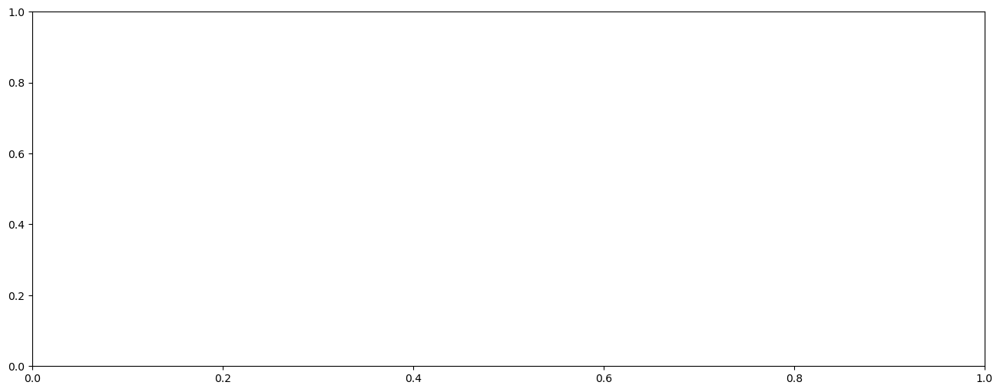

In [37]:
import matplotlib.pyplot as plt
nshot = 1
clip = 50
vmin, vmax = -clip, clip

# Figure
figsize=(16, 6)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs = axs.ravel()
val = cube_stacked
im = axs[0].pcolorfast(x[nshot-1], y[nshot-1], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# x = x[1][:,2:]; y = y[1][:,2:]
# z = z[1][:,2:] - np.flip(z[0][:,3:],axis=1)
# im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
axs[0].set_aspect('auto')
# axs[0].set_aspect(10)
plt.ylim(0,7)
plt.xlim(-10,90)
axs[0].invert_yaxis()
# fig.colorbar(im, ax=axs[0])

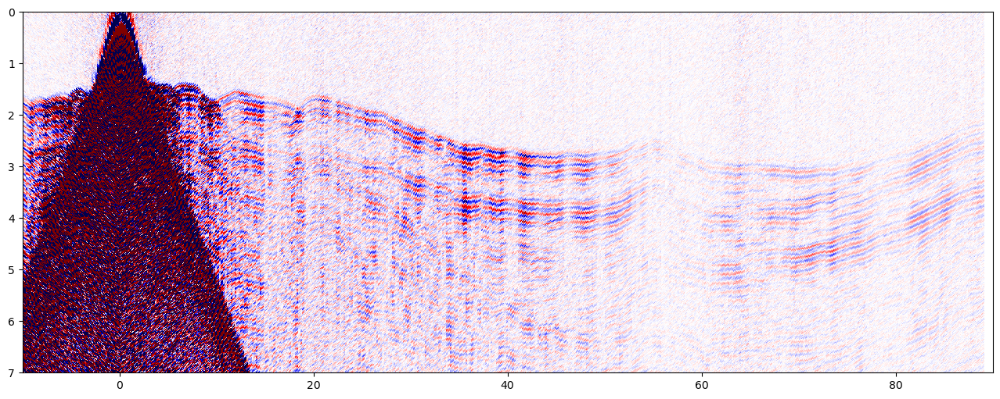

In [4]:
import matplotlib.pyplot as plt
nshoot = 1
clip = 20000
vmin, vmax = -clip, clip

# Figure
figsize=(16, 6)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs = axs.ravel()
# val = z[nshoot-1]
val = highpass(z[nshoot-1], 2, 250)
# val = np.array([highpass(trace, 2, 250) for trace in z[nshoot-1].T]).T
im = axs[0].pcolorfast(x[nshoot-1], y[nshoot-1], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# x = x[1][:,2:]; y = y[1][:,2:]
# z = z[1][:,2:] - np.flip(z[0][:,3:],axis=1)
# im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
axs[0].set_aspect('auto')
# axs[0].set_aspect(10)
plt.ylim(0,7)
plt.xlim(-10,90)
axs[0].invert_yaxis()
# fig.colorbar(im, ax=axs[0])

In [258]:
np.array([highpass(trace, 2, 250) for trace in z[nshoot-1].T]).T.shape

(16000, 501)

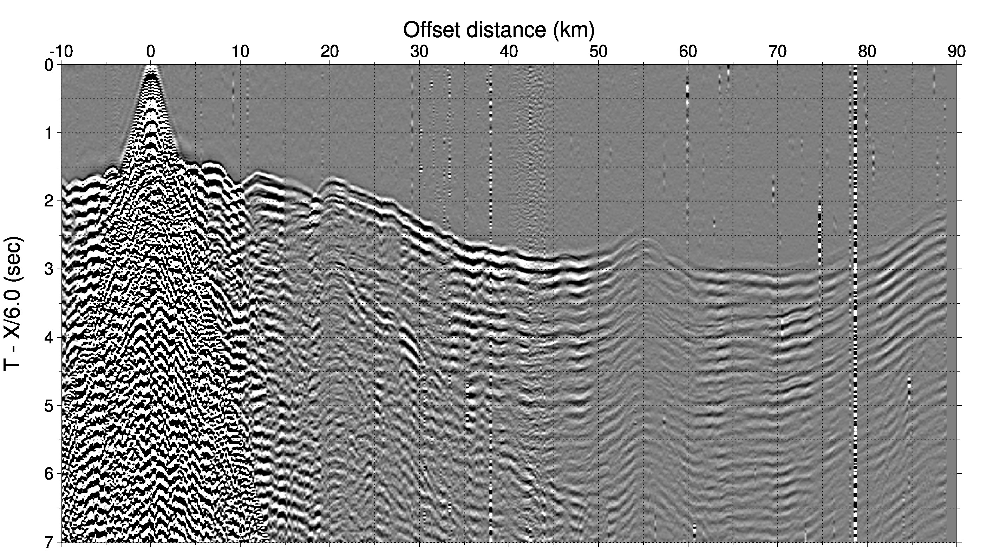

In [15]:
from IPython.display import Image
Image("/Users/junsu/Downloads/C01_4th_shot.jpg")

In [111]:
# line = x[0][0][3:]
# line = x[1][0][2:]
# line = x[2][0][2:]
line = x[3][0][2:]
# line = x[4][0][3:]
print(line.max(), line.min())
len(line)

83.019 -16.579


499

In [116]:
list(range(1,4)), list(range(0,5,4))

([1, 2, 3], [0, 4])

In [17]:
y

[array([[-14.88783333, -14.8545    , -14.82116667, ...,  -1.748     ,
          -1.78116667,  -1.81416667],
        [-14.88383333, -14.8505    , -14.81716667, ...,  -1.744     ,
          -1.77716667,  -1.81016667],
        [-14.87983333, -14.8465    , -14.81316667, ...,  -1.74      ,
          -1.77316667,  -1.80616667],
        ...,
        [ 55.10416667,  55.1375    ,  55.17083333, ...,  68.244     ,
          68.21083333,  68.17783333],
        [ 55.10816667,  55.1415    ,  55.17483333, ...,  68.248     ,
          68.21483333,  68.18183333],
        [ 55.11216667,  55.1455    ,  55.17883333, ...,  68.252     ,
          68.21883333,  68.18583333]]),
 array([[ -1.86383333,  -1.8305    ,  -1.79716667, ..., -14.73833333,
         -14.77166667, -14.80483333],
        [ -1.85983333,  -1.8265    ,  -1.79316667, ..., -14.73433333,
         -14.76766667, -14.80083333],
        [ -1.85583333,  -1.8225    ,  -1.78916667, ..., -14.73033333,
         -14.76366667, -14.79683333],
        ...,


In [19]:
len(np.where(y[1]>0)[1])

7946563

In [3]:
import re
import matplotlib.pyplot as plt

def diversity_stack(z_list, x_list, prefilter=lambda z: highpass(z, 2, 250)):
    # cube=np.array([
    #     np.flip(z[0][:,3:],axis=1),
    #     z[1][:,2:],
    #     z[2][:,2:],
    #     z[3][:,2:],
    #     np.flip(z[4][:,3:],axis=1)
    #     ])
    offsets = x2offsets(x_list)
    cube = np.array([(prefilter(z) if prefilter else z) for z in z_list])
    # print(cube.shape)
    noise = np.ones((cube.shape[0],cube.shape[2]))
    for j in range(cube.shape[2]):
        for i in range(cube.shape[0]):
            start = int(250*abs(offsets[i][j])/6)
            end = start+250
            if abs(offsets[i][j]) > 2:
                noise[i,j] = np.mean(np.abs(cube[i,start:end,j]))
            else:
                noise[i,j] = np.mean(np.abs(cube[i,:20,j]))
            
            cube[i,:,j] /= noise[i,j]
        # cube[:,:,j] *= (1/(noise[i,j]**2) / (np.sum((1/noise[:,j])**2)))
        # cube[:,:,j] *= np.sum(noise[:,j]**2)
    # plt.plot(np.array(aaaa)[1450:1460])
    # aaaa[26]
    cube_stacked = np.sum(cube,axis=0)
    # cube_stacked *= np.sum(noise, axis=0)
    # cube_stacked = cube[0]
    return cube_stacked

def plot_stacked(x, y, stacked_z, vclip):
    vmin, vmax = -vclip, vclip

    # Figure
    figsize=(16, 6)
    fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                        squeeze=False,
                        sharex=True)
    axs = axs.ravel()
    im = axs[0].pcolorfast(x, y, stacked_z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    # x = x[1][:,2:]; y = y[1][:,2:]
    # z = z[1][:,2:] - np.flip(z[0][:,3:],axis=1)
    # im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    axs[0].set_aspect('auto')
    # axs[0].set_aspect(10)
    plt.ylim(0,7)
    xshift = (int(re.search(r'NT24OBS_J(\d+)C-1\.sgy', filename).group(1))-1)*-2
    plt.xlim(-10+xshift,90+xshift)
    axs[0].invert_yaxis()
    # fig.colorbar(im, ax=axs[0])

----

In [4]:
from PIL import Image

def output_image(z_list, x_list, vclip, imgdir, image_size=(256,64), start_reduced_time=0.5, prefilter=None, end_lapse_time=3.06, geospread_corr=0, output_npy=False, reduction_velocity=6.0, sampling_rate=250):
    offsets = x2offsets(x_list)
    crop = np.zeros(shape=image_size)
    count = 0
    for l in range(len(z_list)):
        timeseries = prefilter(z_list[l]) if prefilter else z_list[l]
        offset_distance = offsets[l]
        time_loop = range(0, int(sampling_rate * end_lapse_time)-crop.shape[0], int(crop.shape[0]*0.2))
        # print(list(time_loop))
        offset_loop = range(0, timeseries.shape[1]-crop.shape[1], int(crop.shape[1]*0.2))
        for i in time_loop:
            for j in offset_loop:
                for k in range(crop.shape[1]):
                    start_sample = i + (int(sampling_rate*(start_reduced_time+abs(offset_distance[j+k])/reduction_velocity)) if reduction_velocity is not None else 0)
                    end_sample = start_sample+crop.shape[0]
                    crop[:,k] = timeseries[start_sample:end_sample,j+k]*max(1,geospread_corr*(abs(offset_distance[j+k])/20))

                if output_npy:
                    crop = np.float32(crop/vclip)
                    np.save(f'{imgdir}/{count}', crop.T)
                else:
                    crop[crop<-vclip] = -vclip
                    crop[crop>vclip] = vclip
                    crop+=vclip; crop/=(2*vclip);
                    crop_int=np.uint8(255*crop)
                    # crop = np.int8
                    # Image.fromarray(crop_int).save(f'{imgdir}/st{t}rt{i}of{j}.png')
                    Image.fromarray(crop_int.T).save(f'{imgdir}/{count}.png')
                count+=1
    print(f"Image saved: {count} units with {len(offset_loop)} on offset axis and {len(time_loop)} on time axis")
    return count

## output training

In [87]:
vclip = 10000
imgdir = './dataset/denoising/data_train/data'

output_image(z, offsets, vclip, imgdir)

## output rawdata

In [87]:
from PIL import Image
vclip = 300
imgdir = './dataset/denoising/data_test/raw_hp'
output_image(z, offsets, vclip, imgdir, prefilter=lambda z: highpass(z, 2, 250))
# use_highpass = True
# count=0
# for l in range(len(z)):
#     timeseries = highpass(z[l], 2, 250) if use_highpass else z[l]
#     offset_distance = offsets[l]
#     for i in range(0, 250 * 2, int(crop.shape[0]*0.2)):
#         for j in range(0, timeseries.shape[1]-crop.shape[1], int(crop.shape[1]*0.2)):
#             for k in range(crop.shape[1]):
#                 start_sample = i+int(250*(start_reduced_time+abs(offset_distance[j+k])/6000))
#                 end_sample = start_sample+crop.shape[0]
#                 crop[:,k] = timeseries[start_sample:end_sample,j+k]

#             crop[crop<-vclip] = -vclip
#             crop[crop>vclip] = vclip
#             crop+=vclip; crop/=(2*vclip);
#             crop_int=np.uint8(255*crop)
#             # crop = np.int8
#             # Image.fromarray(crop_int).save(f'{imgdir}/st{t}rt{i}of{j}.png')
#             Image.fromarray(crop_int.T).save(f'{imgdir}/{count}.png')
#             count+=1

NameError: name 'output_image' is not defined

## output training data with homemade diversity stacking

In [67]:
cube_stacked = [diversity_stack(z[1:4],x[1:4])]*3 + [diversity_stack(z[0:5:4],x[0:5:4])]*2

In [4]:
x,y,z = read_segy('noto/NT24OBS_J37C-1.sgy')

In [215]:
import glob
import random

downsample_t_every = None
delta_adjusted = 250/downsample_t_every if downsample_t_every is not None else 250
prefilter_adjusted = lambda z: highpass(z, 2, delta_adjusted)
# alldata = glob.glob('noto/OBS/NT24OBS_J??C-1.sgy')
# random.shuffle(alldata)
# split_idx = int(len(alldata) * 0.8)
# train_data = alldata[:split_idx]
# test_data = alldata[split_idx:]

stacked = []
prestacked = []
x_list = []

for filename in train_data:
    x,y,z = read_segy(filename, downsample_t_every=downsample_t_every)
    # print(filename, [len(offset) for offset in x2offsets(x)])
    stacked += [diversity_stack(z[1:4],x[1:4],prefilter_adjusted)]*3 + [diversity_stack(z[0:5:4],x[0:5:4],prefilter_adjusted)]*2
    # stacked += [prefilter_adjusted(diversity_stack(z[1:4],x[1:4],None))]*3 + [prefilter_adjusted(diversity_stack(z[0:5:4],x[0:5:4],None))]*2
    prestacked += (z[1:4] + z[0:5:4])
    x_list += (x[1:4] + x[0:5:4])
output_image(stacked, x_list, 50, imgdir='./dataset/stacked_paired_training_dwnsmp_t5', image_size=(64,64), output_npy=True, sampling_rate=delta_adjusted)
output_image(prestacked, x_list, 150, imgdir='./dataset/prestacked_training_dwnsmp_t5', image_size=(64,64), prefilter=prefilter_adjusted, output_npy=True, sampling_rate=delta_adjusted)

# stacked = []
# prestacked = []
# x_list = []

# for filename in test_data:
#     x,y,z = read_segy(filename, downsample_t_every=downsample_t_every)
#     # print(filename, [len(offset) for offset in x2offsets(x)])
#     stacked += [diversity_stack(z[1:4],x[1:4],prefilter_adjusted)]*3 + [diversity_stack(z[0:5:4],x[0:5:4],prefilter_adjusted)]*2
#     prestacked += (z[1:4] + z[0:5:4])
#     x_list += (x[1:4] + x[0:5:4])
# output_image(stacked, x_list, 50, imgdir='./dataset/stacked_paired_test_dwnsmp_t5', image_size=(128,64), start_reduced_time=0, end_lapse_time=7.3, geospread_corr=1, output_npy=True, sampling_rate=delta_adjusted)
# output_image(prestacked, x_list, 300, imgdir='./dataset/prestacked_test_dwnsmp_t5', image_size=(128,64), prefilter=prefilter_adjusted, start_reduced_time=0, end_lapse_time=7.3, geospread_corr=1, output_npy=True, sampling_rate=delta_adjusted)

# stacked = []
# x_list = []

# for filename in train_data:
#     x,y,z = read_segy(filename)
#     # print(filename, [len(offset) for offset in x2offsets(x)])
#     stacked += [diversity_stack(z[1:4],x[1:4]) ] + [diversity_stack(z[0:5:4],x[0:5:4])]
#     x_list += (x[1:2] + x[0:1])
# output_image(stacked, x_list, 50, imgdir='./dataset/stacked_single_training', output_npy=True)

# stacked = []
# x_list = []

# for filename in test_data:
#     x,y,z = read_segy(filename)
#     # print(filename, [len(offset) for offset in x2offsets(x)])
#     stacked += [diversity_stack(z[1:4],x[1:4]) ] + [diversity_stack(z[0:5:4],x[0:5:4])]
#     x_list += (x[1:2] + x[0:1])
# output_image(stacked, x_list, 50, imgdir='./dataset/stacked_single_test', output_npy=True)

# vclip = 10000
# imgdir = './dataset/de7noising/data_train/data'

# output_image(z, offsets, vclip, imgdir, output_npy=True)

/opt/homebrew/Caskroom/miniforge/base/envs/diffseis/lib/python3.9/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/homebrew/Caskroom/miniforge/base/envs/diffseis/lib/python3.9/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Image saved: 47360 units with 37 on offset axis and 8 on time axis
Image saved: 47360 units with 37 on offset axis and 8 on time axis


47360

In [263]:
import glob

alldata = glob.glob('nwp/ky0906_EMJS0906_s05-1.sgy')
# alldata = glob.glob('nwp/kr0906ky0903_A2_mcs_s010-1.sgy')
prestacked = []
x_list = []

for filename in alldata:
    x,y,z = read_segy(filename, reduction_velocity=6, original_delta=100, downsample_t_every=-2.5)

    # print(filename, [len(offset) for offset in x2offsets(x)])
    prestacked += ([z[0]])
    x_list += ([x[0]])
output_image(prestacked, x_list, 300, imgdir='./dataset/prestacked_test_nwp300-200m_upsmp', prefilter=lambda z: highpass(z, 2, 250), start_reduced_time=0, end_lapse_time=14.3, geospread_corr=1, output_npy=True, reduction_velocity=6, sampling_rate=250)

#     z_conv = np.array([np.convolve(zi, 1/4*np.ones(4), mode='valid')[4:-4:4] for zi in z[0] ])
#     y_conv = np.array([np.convolve(yi, 1/4*np.ones(4), mode='valid')[4:-4:4] for yi in y[0] ])
#     x_conv = np.array([np.convolve(xi, 1/4*np.ones(4), mode='valid')[4:-4:4] for xi in x[0] ])
#     prestacked += ([z_conv])
#     x_list += ([x_conv])
# output_image(prestacked, x_list, 300, imgdir='./dataset/prestacked_test_nwp300-50m_upsmp', prefilter=lambda z: highpass(z, 2, 250), start_reduced_time=0, end_lapse_time=14.3, geospread_corr=1, output_npy=True, reduction_velocity=6, sampling_rate=250)


Image saved: 5016 units with 76 on offset axis and 66 on time axis


5016

In [257]:
x[0].shape

(20000, 968)

In [ ]:
import glob

alldata = glob.glob('noto/MCS/NT24MCS_J04C-1.sgy')
prestacked = []
x_list = []

for filename in alldata:
    x,y,z = read_segy(filename)
    
    # print(filename, [len(offset) for offset in x2offsets(x)])
    # prestacked += ([z[0]])
    # x_list += ([x[0]])
    z_conv = np.array([np.convolve(zi, 1/4*np.ones(4), mode='valid')[4:-4:4] for zi in z[0] ])
    x_conv = np.array([np.convolve(xi, 1/4*np.ones(4), mode='valid')[4:-4:4] for xi in x[0] ])

    prestacked += ([z_conv])
    x_list += ([x_conv])
# output_image(prestacked, x_list, 300, imgdir='./dataset/prestacked_test_mcs_dwnsmp', prefilter=lambda z: highpass(z, 2, 250), start_reduced_time=0, end_lapse_time=6.3, geospread_corr=1, output_npy=True)


In [183]:
z[0].shape

(4000, 968)

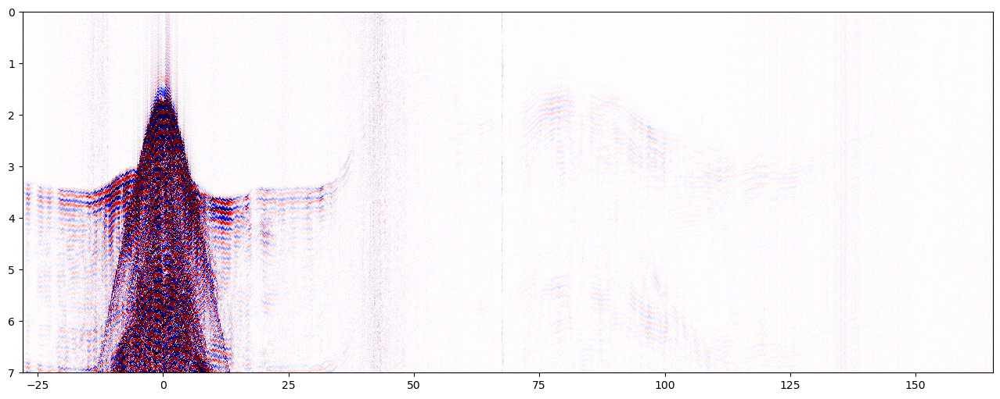

In [242]:
import matplotlib.pyplot as plt
nshoot = 1
clip = 1000
# clip = 1
vmin, vmax = -clip, clip

# Figure
figsize=(16, 6)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs = axs.ravel()
# val = z[nshoot-1]
val = highpass(z[nshoot-1], 2, 250)
# val = np.load('results/demultiple0116-waveform/canvas-nwp_dwnsmp_inp-0.npy')
# x,y,z = get_xyz(raws, offsets, num_sample=8000, reduction_velocity=None)
# val = np.array([highpass(trace, 2, 250) for trace in z[nshoot-1].T]).T
im = axs[0].pcolorfast(x[nshoot-1][:val.shape[0],:val.shape[1]], y[nshoot-1][:val.shape[0],:val.shape[1]], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# im = axs[0].pcolorfast(x_conv[:val.shape[0],:val.shape[1]], y_conv[:val.shape[0],:val.shape[1]], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# x = x[1][:,2:]; y = y[1][:,2:]
# z = z[1][:,2:] - np.flip(z[0][:,3:],axis=1)
# im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
axs[0].set_aspect('auto')
# axs[0].set_aspect(10)
plt.ylim(0,7)
# plt.xlim(-10,90)
# plt.xlim(-50,50)
axs[0].invert_yaxis()
# fig.colorbar(im, ax=axs[0])

In [117]:
x[0].shape

(8000, 968)

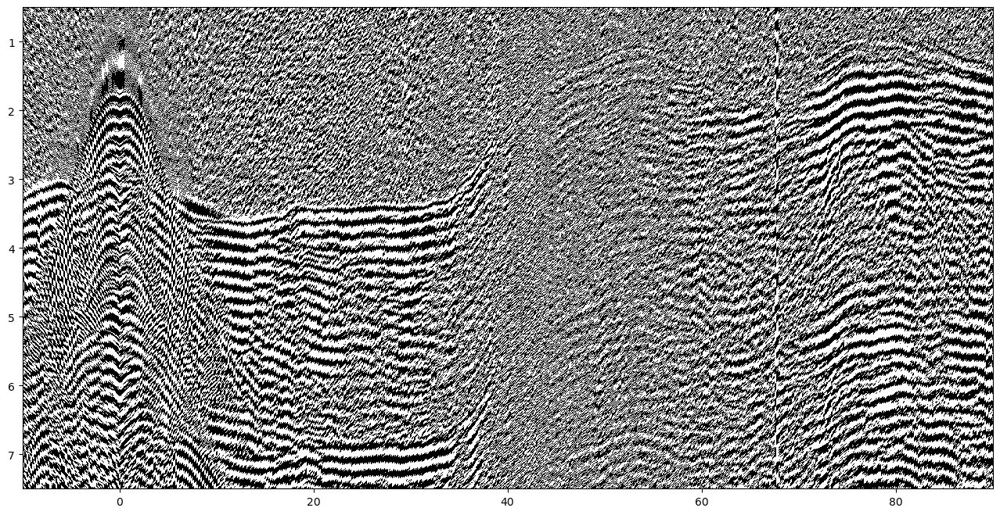

In [244]:
import matplotlib.pyplot as plt
nshoot = 1
clip = 300
# clip = 1
vmin, vmax = -clip, clip

# Figure
figsize=(16, 8)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs = axs.ravel()
# val = z[nshoot-1]
val = highpass(z[nshoot-1], 2, 250)
# val = np.load('results/demultiple0116-waveform/canvas-nwp_dwnsmp_inp-0.npy')
# x,y,z = get_xyz(raws, offsets, num_sample=8000, reduction_velocity=None)
# val = np.array([highpass(trace, 2, 250) for trace in z[nshoot-1].T]).T
# im = axs[0].pcolorfast(x[nshoot-1][:val.shape[0],:val.shape[1]], y[nshoot-1][:val.shape[0],:val.shape[1]], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
im = axs[0].pcolorfast(x[nshoot-1][:val.shape[0],:val.shape[1]], y[nshoot-1][:val.shape[0],:val.shape[1]], val[:-1,:-1], cmap=plt.cm.grey, vmin=-1e-6, vmax=1e-6)
# im = axs[0].pcolorfast(x_conv[:val.shape[0],:val.shape[1]], y_conv[:val.shape[0],:val.shape[1]], val[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
# x = x[1][:,2:]; y = y[1][:,2:]
# z = z[1][:,2:] - np.flip(z[0][:,3:],axis=1)
# im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
axs[0].set_aspect('auto')
# axs[0].set_aspect(10)
plt.ylim(0.5,7.5)
# plt.ylim(0,15)
plt.xlim(-10,90)
# plt.xlim(-50,50)
axs[0].invert_yaxis()
# fig.colorbar(im, ax=axs[0])

In [117]:
np.min(x[0])

np.float64(-17.949)

In [26]:
len(x_list)

10

In [265]:
for filename in train_data:
    print(filename)

noto/OBS/NT24OBS_J34C-1.sgy
noto/OBS/NT24OBS_J24C-1.sgy
noto/OBS/NT24OBS_J22C-1.sgy
noto/OBS/NT24OBS_J13C-1.sgy
noto/OBS/NT24OBS_J38C-1.sgy
noto/OBS/NT24OBS_J33C-1.sgy
noto/OBS/NT24OBS_J11C-1.sgy
noto/OBS/NT24OBS_J07C-1.sgy
noto/OBS/NT24OBS_J36C-1.sgy
noto/OBS/NT24OBS_J10C-1.sgy
noto/OBS/NT24OBS_J27C-1.sgy
noto/OBS/NT24OBS_J35C-1.sgy
noto/OBS/NT24OBS_J39C-1.sgy
noto/OBS/NT24OBS_J09C-1.sgy
noto/OBS/NT24OBS_J25C-1.sgy
noto/OBS/NT24OBS_J14C-1.sgy
noto/OBS/NT24OBS_J40C-1.sgy
noto/OBS/NT24OBS_J17C-1.sgy
noto/OBS/NT24OBS_J05C-1.sgy
noto/OBS/NT24OBS_J03C-1.sgy
noto/OBS/NT24OBS_J02C-1.sgy
noto/OBS/NT24OBS_J32C-1.sgy
noto/OBS/NT24OBS_J18C-1.sgy
noto/OBS/NT24OBS_J26C-1.sgy
noto/OBS/NT24OBS_J31C-1.sgy
noto/OBS/NT24OBS_J30C-1.sgy
noto/OBS/NT24OBS_J06C-1.sgy
noto/OBS/NT24OBS_J28C-1.sgy
noto/OBS/NT24OBS_J29C-1.sgy
noto/OBS/NT24OBS_J16C-1.sgy
noto/OBS/NT24OBS_J21C-1.sgy
noto/OBS/NT24OBS_J37C-1.sgy


In [264]:
for filename in test_data:
    print(filename)

noto/OBS/NT24OBS_J01C-1.sgy
noto/OBS/NT24OBS_J15C-1.sgy
noto/OBS/NT24OBS_J04C-1.sgy
noto/OBS/NT24OBS_J20C-1.sgy
noto/OBS/NT24OBS_J23C-1.sgy
noto/OBS/NT24OBS_J12C-1.sgy
noto/OBS/NT24OBS_J19C-1.sgy
noto/OBS/NT24OBS_J08C-1.sgy


In [19]:
for filename in test_data:
    print(filename)

noto/OBS/NT24OBS_J27C-1.sgy
noto/OBS/NT24OBS_J28C-1.sgy
noto/OBS/NT24OBS_J06C-1.sgy
noto/OBS/NT24OBS_J04C-1.sgy
noto/OBS/NT24OBS_J24C-1.sgy
noto/OBS/NT24OBS_J09C-1.sgy
noto/OBS/NT24OBS_J26C-1.sgy
noto/OBS/NT24OBS_J21C-1.sgy


In [8]:
# downsampled
for filename in test_data:
    print(filename)

noto/OBS/NT24OBS_J01C-1.sgy
noto/OBS/NT24OBS_J15C-1.sgy
noto/OBS/NT24OBS_J04C-1.sgy
noto/OBS/NT24OBS_J20C-1.sgy
noto/OBS/NT24OBS_J23C-1.sgy
noto/OBS/NT24OBS_J12C-1.sgy
noto/OBS/NT24OBS_J19C-1.sgy
noto/OBS/NT24OBS_J08C-1.sgy


In [10]:
import glob

stacked = []
x_list = []

for filename in glob.glob('noto/NT24OBS_J??C-1.sgy'):
    x,y,z = read_segy(filename)
    print(filename, [len(offset) for offset in x2offsets(x)])
    stacked += [diversity_stack(z[1:4],x[1:4]) ] + [diversity_stack(z[0:5:4],x[0:5:4])]
    x_list += (x[1:4] + x[0:5:4])
output_image(stacked, x_list, 50, imgdir='./dataset/denoising/data_train/data')

noto/NT24OBS_J37C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J29C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J25C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J13C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J01C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J39C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J27C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J35C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J03C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J11C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J15C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J19C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J07C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J31C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J23C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J05C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J17C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J09C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J21C-1.sgy [503, 502, 502, 502, 503]
noto/NT24OBS_J33C-1.sgy [503, 502, 502, 502, 503]


14800

In [10]:
for array in stacked: print(array.shape)

(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)
(17501, 502)
(17501, 503)
(17501, 503)
(17501, 502)
(17501, 502)

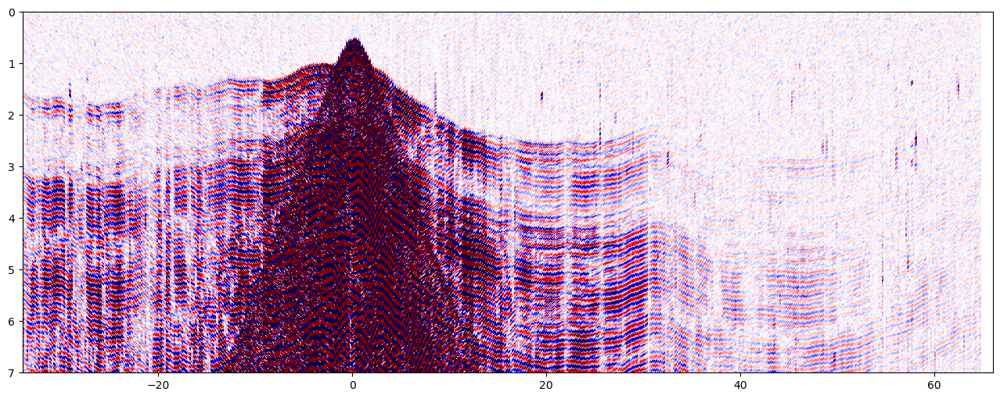

In [91]:
cube_stacked = diversity_stack(z[1:4],x[1:4])
plot_stacked(x[1], y[1], cube_stacked, 50)


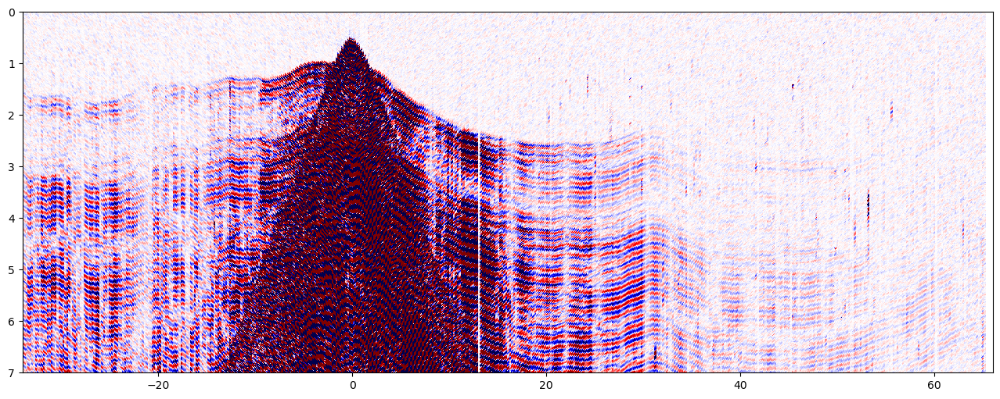

In [92]:
cube_stacked = diversity_stack(z[0:5:4],x[0:5:4])
plot_stacked(x[0], y[0], cube_stacked, 50)

In [7]:
cube_stacked

NameError: name 'cube_stacked' is not defined

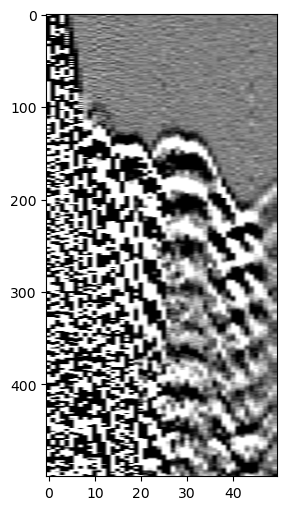

In [74]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                squeeze=False,
                sharex=True)
axs[0,0].imshow(crop, cmap=plt.cm.gray,vmin=0, vmax=255)
axs[0,0].set_aspect(0.2)

In [69]:
for k in range(crop.shape[1]):
    start_sample = i+int(250*(start_reduced_time+abs(offsets[t,j+k])/6000))
    end_sample = start_sample+crop.shape[0]
    crop[:,k] = z[t][start_sample:end_sample,j+k]

In [70]:
from PIL import Image
crop[crop<-10000] = -10000
crop[crop>10000] = 10000
crop+=10000; crop/=20000; crop*=255
# crop = np.int8
Image.fromarray(crop).show()

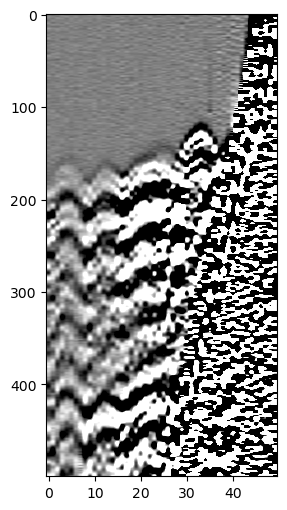

In [43]:
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs[0,0].imshow(crop, cmap=plt.cm.gray,vmin=-10000, vmax=10000)
axs[0,0].set_aspect(0.2)
# plt.xlim(0,25)

In [268]:
cube_stacked

array([[ 2.56807723e+00,  1.18064634e+00,  1.19879892e-01, ...,
         1.09717037e+00,  4.81620104e-01, -3.19562138e+01],
       [ 4.40297014e+00,  4.85454925e+00, -8.04437958e+00, ...,
        -9.40064482e+00, -4.45680032e+00, -1.77507371e+02],
       [ 1.08126666e+00,  1.08469092e+01, -7.27287001e+00, ...,
        -1.75651604e+01,  8.62806231e-01, -2.85792383e+02],
       ...,
       [-4.37078046e+00, -2.86051733e+00,  2.23590735e+00, ...,
        -4.34995367e-01, -9.86133519e-01, -2.40627410e+02],
       [ 6.05374872e+00, -1.11371196e+01,  4.46879309e+00, ...,
         1.22580349e+01,  3.47759186e+00, -8.58570243e+01],
       [-5.90249886e-01, -3.22981609e+00, -5.82109169e-01, ...,
         1.86311668e-01, -2.77556390e-01, -1.76678546e+01]])

In [182]:
np.max(cube[2,:200,430:450])

np.int64(1937)

In [117]:
cube.shape

(3, 17501, 502)

In [26]:
# np.diff(cube,axis=0).shape
cube_diff = np.diff(cube,axis=0)[0,:,:]

In [27]:
cube_diff.shape

(17501, 500)

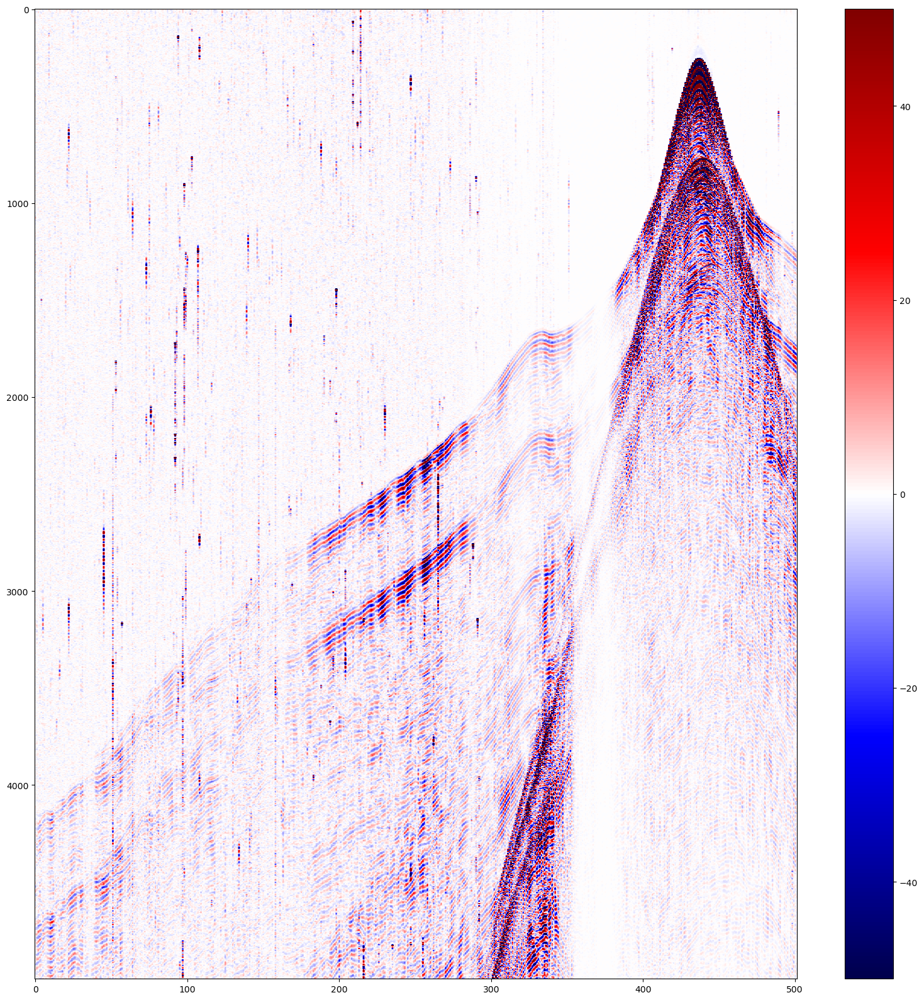

In [309]:
import matplotlib.pyplot as plt
clip = 50
vmin, vmax = -clip, clip
shift = 15

# Figure
figsize=(16, 16)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
axs = axs.ravel()
for i in range(len(axs)):
    # im = axs[0].imshow(raw[200:250].T[10000:10200], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    # im = axs[i].imshow(raw.T, cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)

    # for j in range(500):
    #     cube[1,:,j] = np.concatenate([np.zeros(shift), cube[1,:,j][:-shift]])
    # im = axs[i].imshow(np.diff(cube,axis=0)[i,:,:], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)

    # im = axs[i].imshow(val[:5000,398:420], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    # im = axs[i].imshow(val[:5000,:], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    im = axs[i].imshow(cube_stacked[:5000,:], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)


    # im = axs[i].imshow(cube[i,:,90:100], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    # z = raw[:502].T
    # im = axs[0].pcolorfast(x, y, z[:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    if i>0: axs[i].set_yticks([])
    axs[i].set_aspect('auto')
    # axs[0].set_aspect(10)
    # axs[0].invert_yaxis()
fig.tight_layout()
fig.colorbar(im, ax=axs[-1])
# plt.xlim(230,280)

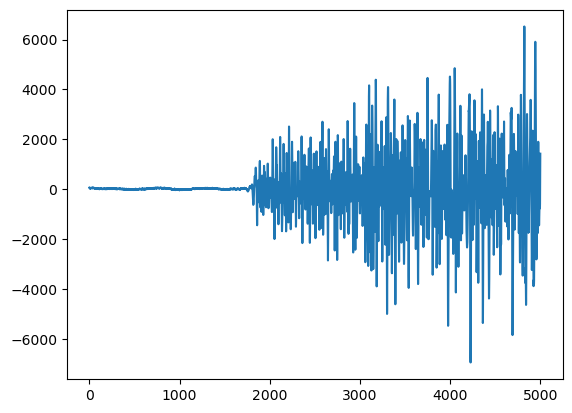

In [57]:
# plt.subplots(311)
# plt.plot(cube[0,:,151])
plt.plot(val[:5000,450])
# plt.subplots(312)
# plt.plot(cube[0,:,97])
# plt.subplots(313)
# plt.plot(cube[0,:,99])

In [680]:
traces = cube[:,:,230]

traces

array([[ 24,  15,  18, ..., -17,  17,  -8],
       [ -6,  -5,  -7, ...,  22, 105, 112],
       [-36, -36, -42, ...,  31,  22,   4],
       [ 19,  10,  21, ...,  36,  42,  38],
       [ 26,  14,  -6, ...,  -3,  10,   9]], dtype=int32)

/var/folders/r9/85r4nw6n49777jfw93jkdl4m0000gn/T/ipykernel_20144/52796268.py:2: RuntimeWarning: divide by zero encountered in divide
  plt.plot(np.concatenate([np.zeros(13), traces[1][:-13]])/traces[0])
/var/folders/r9/85r4nw6n49777jfw93jkdl4m0000gn/T/ipykernel_20144/52796268.py:2: RuntimeWarning: invalid value encountered in divide
  plt.plot(np.concatenate([np.zeros(13), traces[1][:-13]])/traces[0])


(-100.0, 100.0)

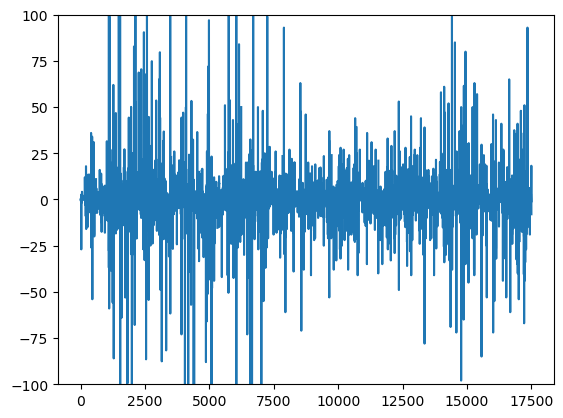

In [697]:
# plt.plot( traces[1]/ traces[0])
plt.plot(np.concatenate([np.zeros(13), traces[1][:-13]])/traces[0])
plt.ylim(-100,100)

np.int64(0)

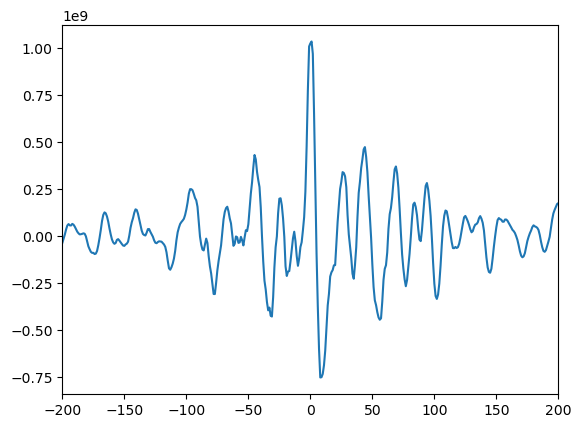

In [696]:
traces = cube[:,:,230]
# plt.plot(np.correlate(traces[0],traces[1],'full'))
plt.plot(np.arange(-17500,17501), np.correlate(traces[0],np.concatenate([np.zeros(12), traces[1][:-12]]),'full'))
plt.xlim(-200,200)

# np.concatenate([np.zeros(10), traces[0][:-10]])
np.argmax(np.correlate(traces[0],np.concatenate([np.zeros(13), traces[1][:-13]]),'full'))-17500

In [12]:
x

[array([[ 89.327,  89.127,  88.927, ..., -10.488, -10.687, -10.885],
        [ 89.327,  89.127,  88.927, ..., -10.488, -10.687, -10.885],
        [ 89.327,  89.127,  88.927, ..., -10.488, -10.687, -10.885],
        ...,
        [ 89.327,  89.127,  88.927, ..., -10.488, -10.687, -10.885],
        [ 89.327,  89.127,  88.927, ..., -10.488, -10.687, -10.885],
        [ 89.327,  89.127,  88.927, ..., -10.488, -10.687, -10.885]]),
 array([[-11.183, -10.983, -10.783, ...,  88.43 ,  88.63 ,  88.829],
        [-11.183, -10.983, -10.783, ...,  88.43 ,  88.63 ,  88.829],
        [-11.183, -10.983, -10.783, ...,  88.43 ,  88.63 ,  88.829],
        ...,
        [-11.183, -10.983, -10.783, ...,  88.43 ,  88.63 ,  88.829],
        [-11.183, -10.983, -10.783, ...,  88.43 ,  88.63 ,  88.829],
        [-11.183, -10.983, -10.783, ...,  88.43 ,  88.63 ,  88.829]]),
 array([[-11.283, -11.084, -10.884, ...,  88.529,  88.729,  88.93 ],
        [-11.283, -11.084, -10.884, ...,  88.529,  88.729,  88.93 ],
    

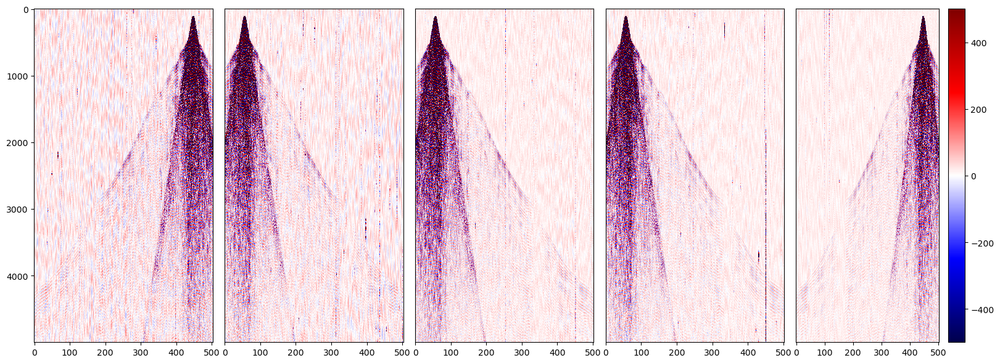

In [6]:
import matplotlib.pyplot as plt

clip = 5e+2
vmin, vmax = -clip, clip

# Figure
figsize=(16, 6)
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=figsize, facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)

axs = axs.ravel()
for i in range(len(axs)):
    # im = axs[0].imshow(raw[200:250].T[10000:10200], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    # im = axs[i].imshow(raw.T, cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    im = axs[i].imshow(z[i][:5000,:], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    # z = raw[:502].T
    # im = axs[i].pcolorfast(x[i], y[i], z[i][:-1,:-1], cmap=plt.cm.seismic, vmin=vmin, vmax=vmax)
    if i>0: axs[i].set_yticks([])
    axs[i].set_aspect('auto')
    # axs[0].set_aspect(10)
    # axs[0].invert_yaxis()
fig.tight_layout()
fig.colorbar(im, ax=axs[-1])

In [165]:
raw[227,11200:11300]

array([-115, -317,  197,   72, -163,   24,  277, -213,   37,  402, -331,
          5,  280, -277,  -35,  286,  -47, -181,  183,   82, -132,   28,
         89,  -21,  -86,   36,    9,   23,    6,  -86,   21,  -65,  -97,
        153,  122, -202,   45,  447, -113, -369,  391,  129, -457,  260,
        272, -322, -117,  115,   17,   13,  243, -107, -184,  386, -103,
       -266,  416,   35, -266,  130,    9,  -47,  148,   54, -114,   61,
        246, -201,  -90,  378, -139, -232,  253,   35, -190,   77,  147,
        -23,   49,  148,  -85, -109,  130,   10,  -38,  123,   16,  -54,
          7,   16,  183,   16, -248,  206,  330, -156, -246,  263,   96,
       -440], dtype=int32)

Text(0, 0.5, 'frequency (Hz)')

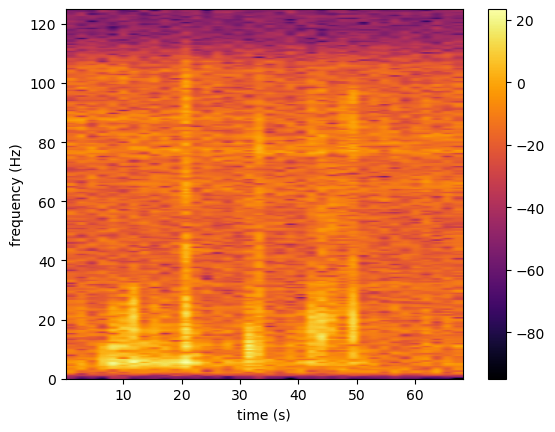

In [321]:
fig, ax = plt.subplots()
Pxx, freqs, t, im = ax.specgram(val[:,200], Fs=250,
                cmap=plt.cm.inferno,
                NFFT=512, noverlap=64)
# ax.set_yscale('log')
fig.colorbar(im, ax=ax)
plt.xlabel('time (s)')
plt.ylabel('frequency (Hz)')

Text(0, 0.5, 'frequency (Hz)')

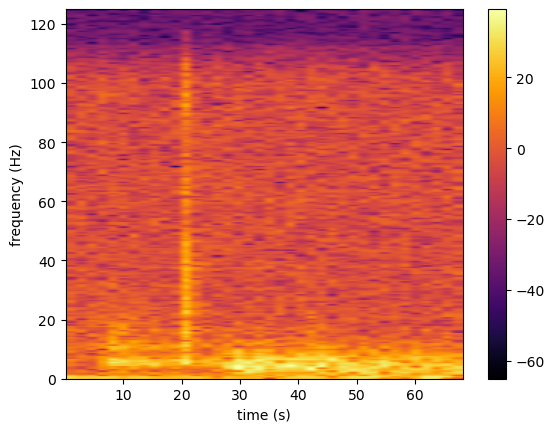

In [87]:
fig, ax = plt.subplots()
Pxx, freqs, t, im = ax.specgram(val[:,201], Fs=250,
                cmap=plt.cm.inferno,
                NFFT=512, noverlap=64)
# ax.set_yscale('log')
fig.colorbar(im, ax=ax)
plt.xlabel('time (s)')
plt.ylabel('frequency (Hz)')

In [ ]:
diversity stacking

In [183]:
import matplotlib.mlab as mlab
# pxx, freq = mlab.psd(cube[1,:,49], Fs=250,
#             NFFT=256, noverlap=64)
psds = [10*np.log10(mlab.psd(cube[i,:,j], Fs=250, NFFT=512, noverlap=64)[0]) for i in range(5) for j in range(500)]
# convolved = [correlate2d(z[i], v.T, mode="same", boundary="wrap") for i in range(5)]
# psds = [10*np.log10(mlab.psd(convolved[i][:,j], Fs=250, NFFT=256, noverlap=64)[0]) for i in range(5) for j in range(500)]

IndexError: index 3 is out of bounds for axis 0 with size 3

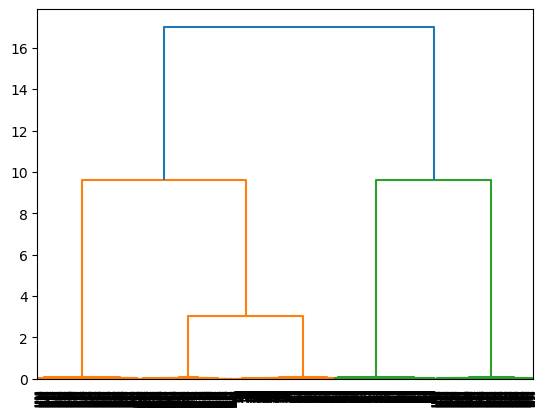

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
# psds[2]
def min_max(x, axis=None):
    min = x.min(axis=axis, keepdims=True)
    max = x.max(axis=axis, keepdims=True)
    result = (x-min)/(max-min)
    return result

linkage_data = linkage(min_max(np.array(psds),axis=1), method='ward', metric='euclidean')
dendrogram(linkage_data)
c = fcluster(linkage_data, t=4, criterion='maxclust')


In [86]:
np.where(c==4)

(array([1500, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508, 1509, 1510,
        1511, 1512, 1513, 1514, 1515, 1516, 1517, 1518, 1519, 1520, 1521,
        1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532,
        1533, 1534, 1535, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1543,
        1544, 1545, 1546, 1547, 1548, 1549, 1550, 1551, 1552, 1553, 1554,
        1555, 1556, 1557, 1558, 1559, 1560, 1561, 1562, 1563, 1564, 1565,
        1566, 1567, 1568, 1569, 1570, 1571, 1572, 1573, 1574, 1575, 1576,
        1577, 1578, 1579, 1580, 1581, 1582, 1583, 1584, 1585, 1586, 1587,
        1588, 1589, 1590, 1591, 1592, 1593, 1594, 1595, 1596, 1597, 1598,
        1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606, 1607, 1608, 1609,
        1610, 1611, 1612, 1613, 1614, 1615, 1616, 1617, 1618, 1619, 1620,
        1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1630, 1631,
        1632, 1633, 1634, 1635, 1636, 1637, 1638, 1639, 1640, 1641, 1642,
        1643, 1644, 1645, 1646, 1647, 

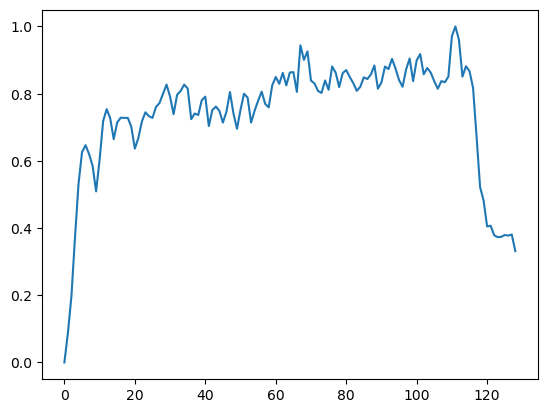

In [931]:
def min_max(x, axis=None):
    min = x.min(axis=axis, keepdims=True)
    max = x.max(axis=axis, keepdims=True)
    result = (x-min)/(max-min)
    return result

plt.plot(min_max(np.array(psds),axis=1)[2])

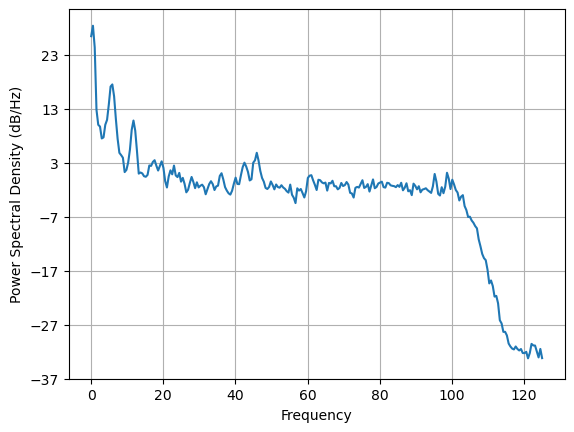

In [79]:
# _ = plt.psd(cube[0,:,99], Fs=250,
#             NFFT=512, noverlap=64)
_ = plt.psd(z[2][:,389], Fs=250,
            NFFT=512, noverlap=64)

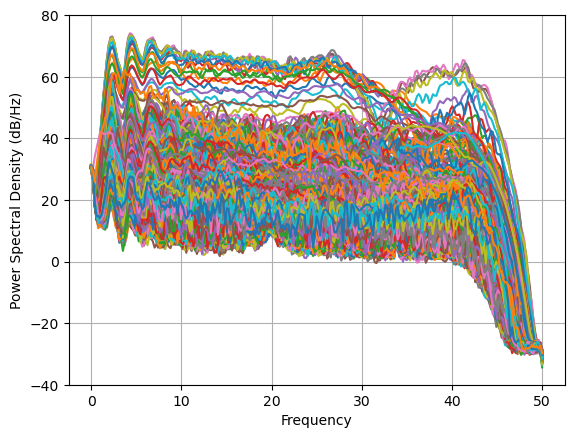

In [311]:
Pxx_list = []
freq_list = []
for i in range(z.shape[1]):
    Pxx, freq = plt.psd(z[:,i], Fs=250,
            NFFT=512, noverlap=64)
    Pxx_list.append(Pxx)
    freq_list.append(freq)
# plt.legend()

In [316]:
Pxx_list = np.array(Pxx_list)

In [326]:
(np.log10(Pxx_list)*10).mean(axis=1)[51]

np.float64(20.80170580138398)

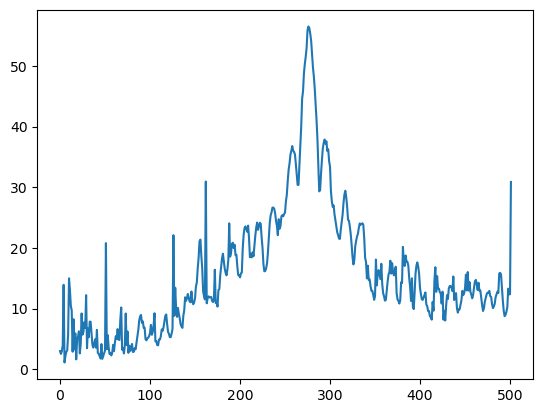

In [321]:
plt.plot((np.log10(Pxx_list)*10).mean(axis=1))